# Pigs YOLOv8 Train and Predict

In [ ]:
#!rm -rf 

In [5]:
!pip install wandb
!wandb --version
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 37.1 MB/s eta 0:00:00a 0:00:01
wandb, version 0.16.3


In [6]:
# Wandb login:
from kaggle_secrets import UserSecretsClient
import wandb
user_secrets = UserSecretsClient()
secret_value = user_secrets.get_secret("wandb_api_key")
wandb.login(key=secret_value)

wandb: Currently logged in as: gulabpatel923-gmail-com. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [7]:
import os
import cv2
import random
import numpy as np
import pandas as pd
from tqdm import tqdm
import shutil
from shutil import copyfile
import matplotlib.pyplot as plt
from matplotlib import animation, rc
rc('animation', html='jshtml')
from PIL import Image
import ultralytics
from ultralytics import YOLO
ultralytics.checks()

Ultralytics YOLOv8.1.11 🚀 Python-3.10.13 torch-2.1.2+cpu CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5432.1/8062.4 GB disk)


In [8]:
!mkdir datasets
#!mkdir datasets/train
#!mkdir datasets/valid
#!mkdir datasets/test

train_path='datasets/train/'
valid_path='datasets/valid/'
test_path='datasets/test/'

mkdir: cannot create directory 'datasets': File exists


In [9]:
import zipfile

def create_zip(source_folder, destination_zip):
    with zipfile.ZipFile(destination_zip, 'w', zipfile.ZIP_DEFLATED) as zip_ref:
        for root, dirs, files in os.walk(source_folder):
            for file in files:
                file_path = os.path.join(root, file)
                zip_ref.write(file_path, arcname=os.path.relpath(file_path, source_folder))

def extract_zip(zip_file, destination_folder):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(destination_folder)

source_folder = '/kaggle/input/pigs-images-get-annotation-info-from-xml/datasets'
destination_zip = '/kaggle/working/folder.zip'
destination_folder = '/kaggle/working/datasets'

create_zip(source_folder, destination_zip)
extract_zip(destination_zip, destination_folder)     

# Create yaml file 

In [10]:
import yaml

data_yaml = dict(
    train ='train',
    val ='valid',
    test='test',
    nc =1,
    names =['cow']
)

with open('data.yaml', 'w') as outfile:
    yaml.dump(data_yaml, outfile, default_flow_style=True)
    
%cat data.yaml

{names: [cow], nc: 1, test: test, train: train, val: valid}


In [11]:
names =['cow']
M=list(range(len(names)))
class_map=dict(zip(M,names))

# Train

In [12]:
model = YOLO("yolov8x.pt") 

100%|██████████| 131M/131M [00:00<00:00, 255MB/s] 


In [13]:
!yolo task=detect mode=train model=yolov8x.pt data=data.yaml epochs=30 imgsz=480

Ultralytics YOLOv8.1.11 🚀 Python-3.10.13 torch-2.1.2+cpu CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=data.yaml, epochs=30, time=None, patience=50, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=

# Result of Training

In [15]:
paths2=[]
for dirname, _, filenames in os.walk('/kaggle/working/runs/detect/train'):
    for filename in filenames:
        if filename[-4:]=='.png' or filename[-4:]=='.jpg':
            paths2+=[(os.path.join(dirname, filename))]
paths2=sorted(paths2)
print(len(paths2))
print(paths2[0:3])

17
['/kaggle/working/runs/detect/train/F1_curve.png', '/kaggle/working/runs/detect/train/PR_curve.png', '/kaggle/working/runs/detect/train/P_curve.png']


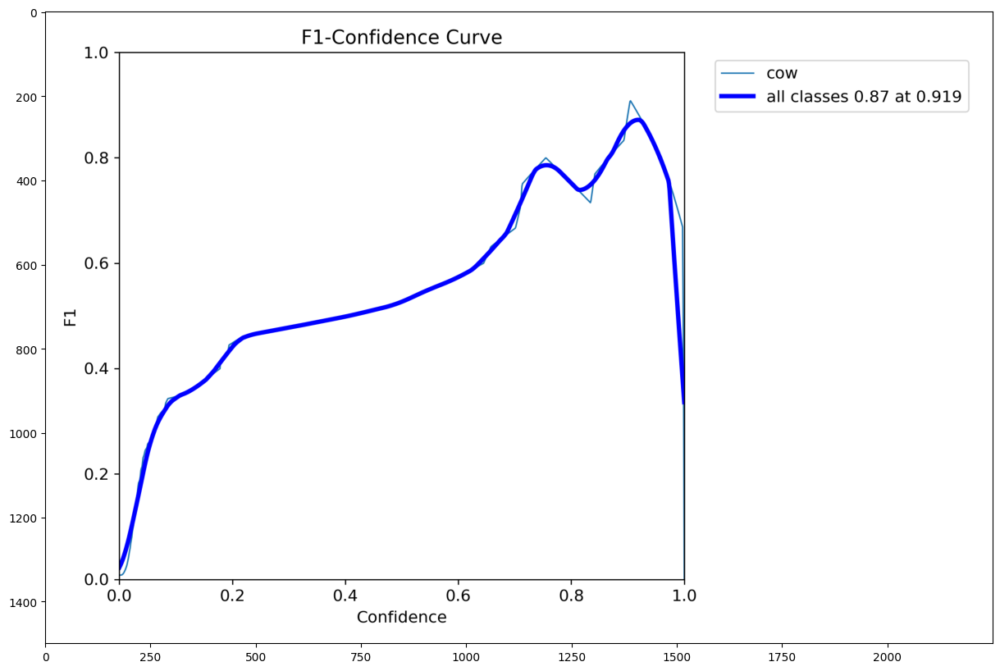

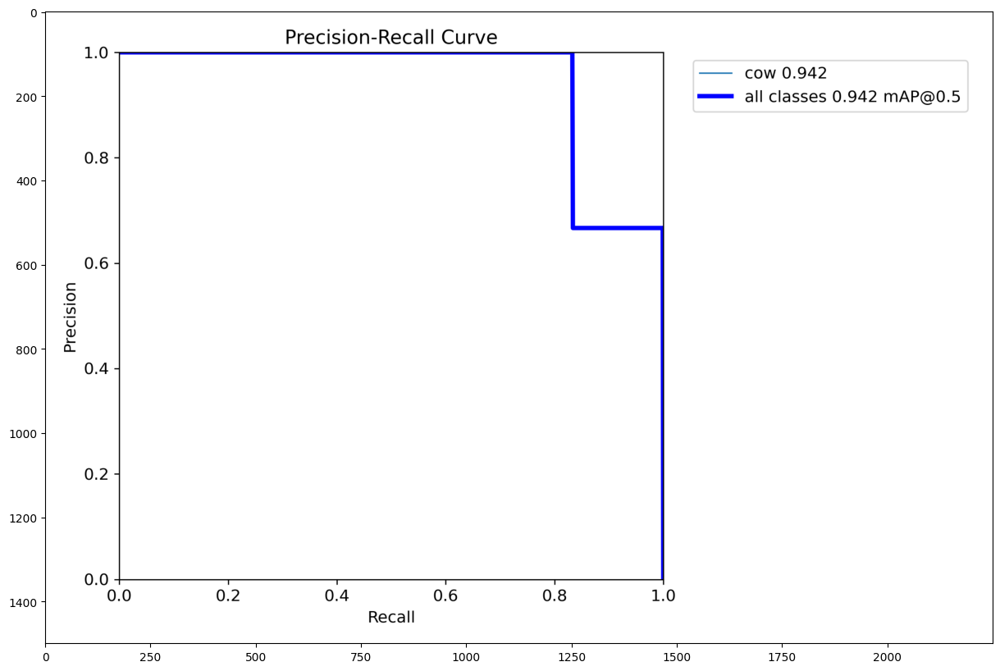

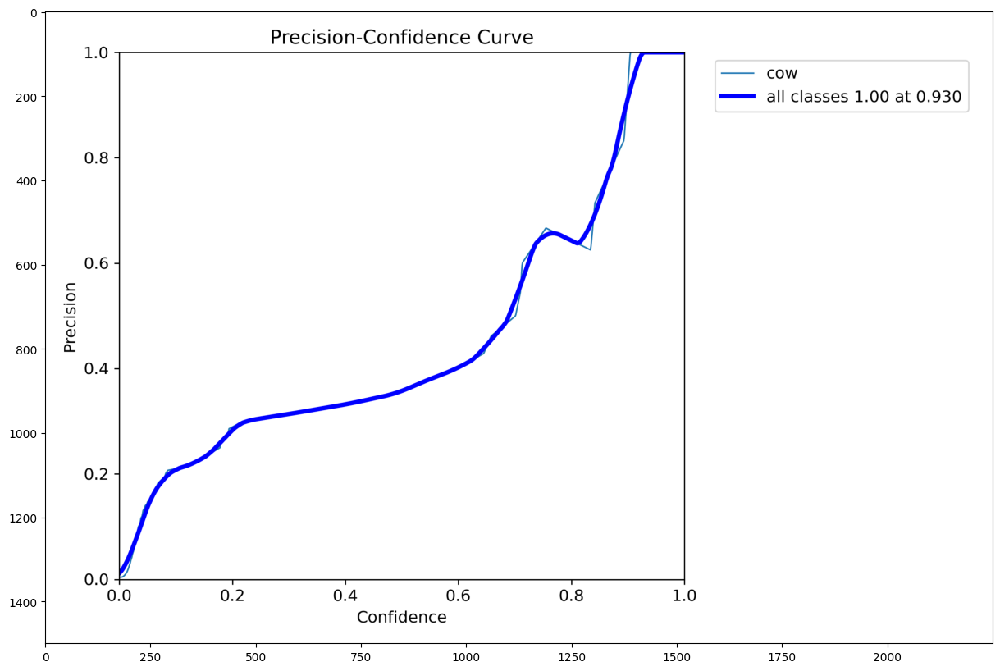

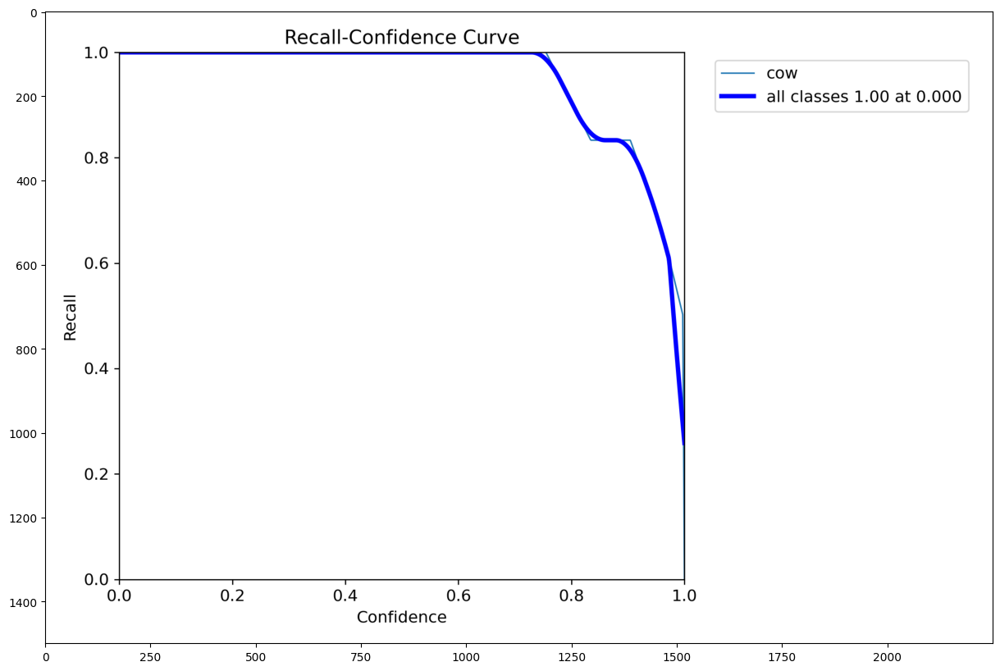

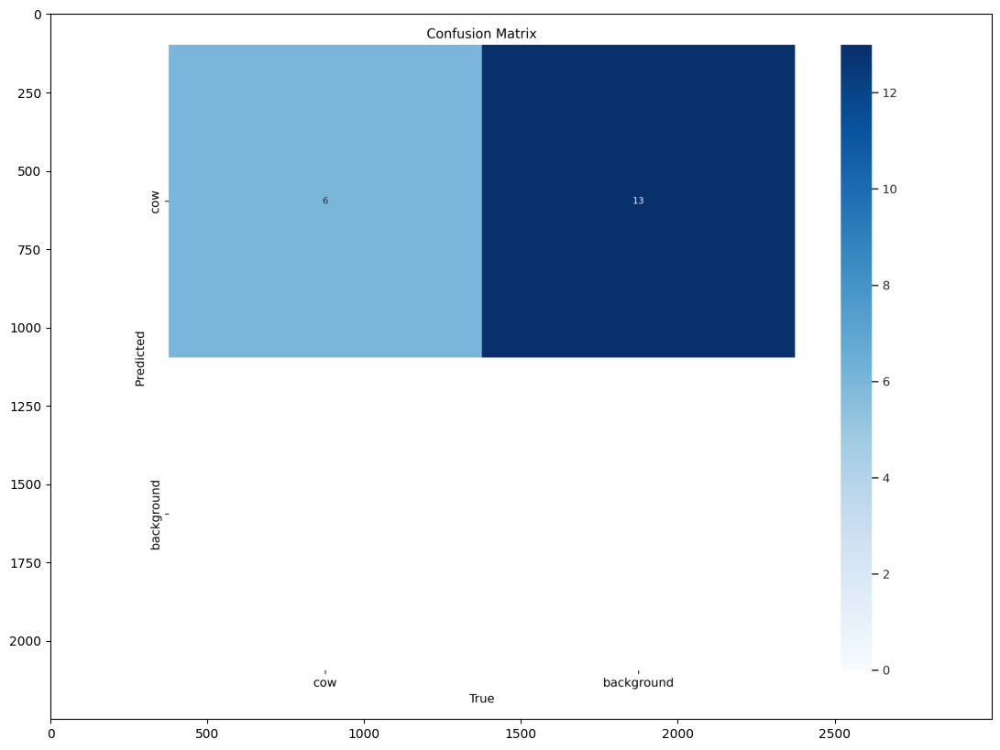

...

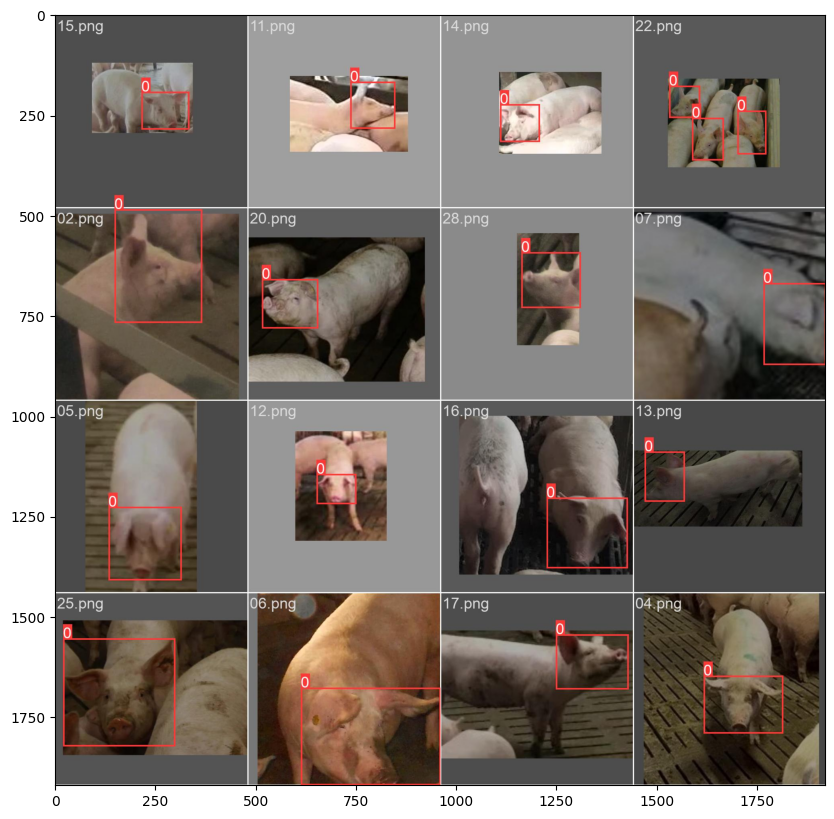

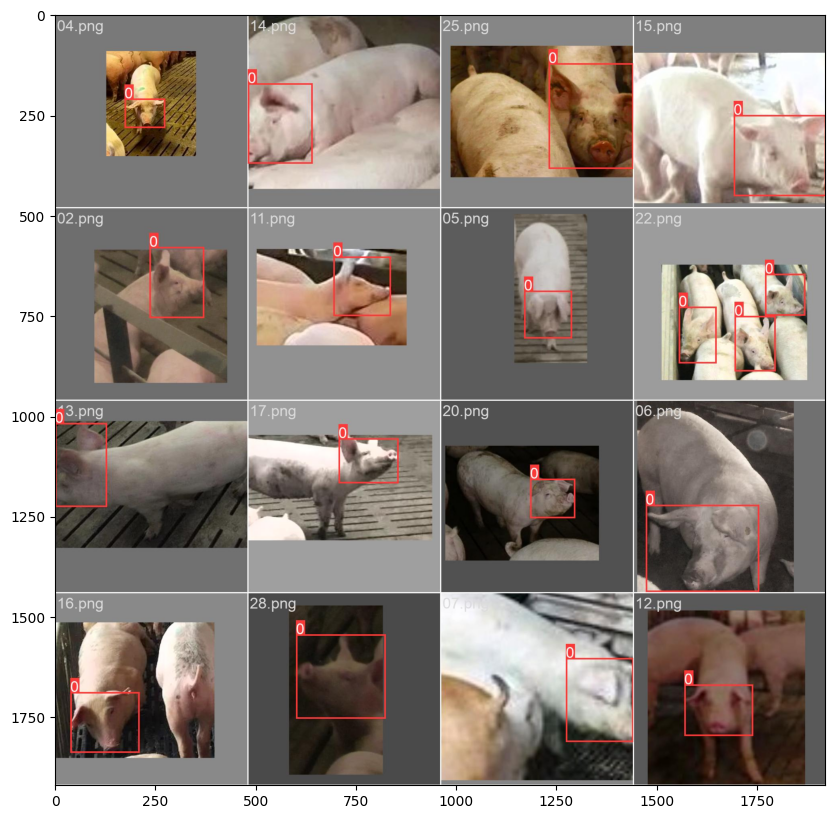

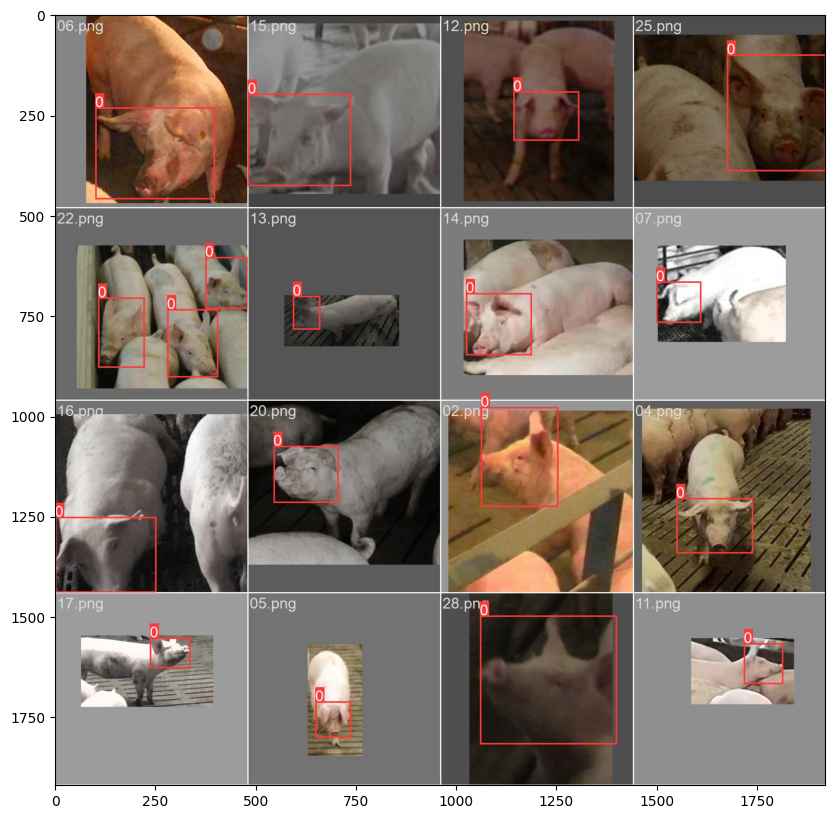

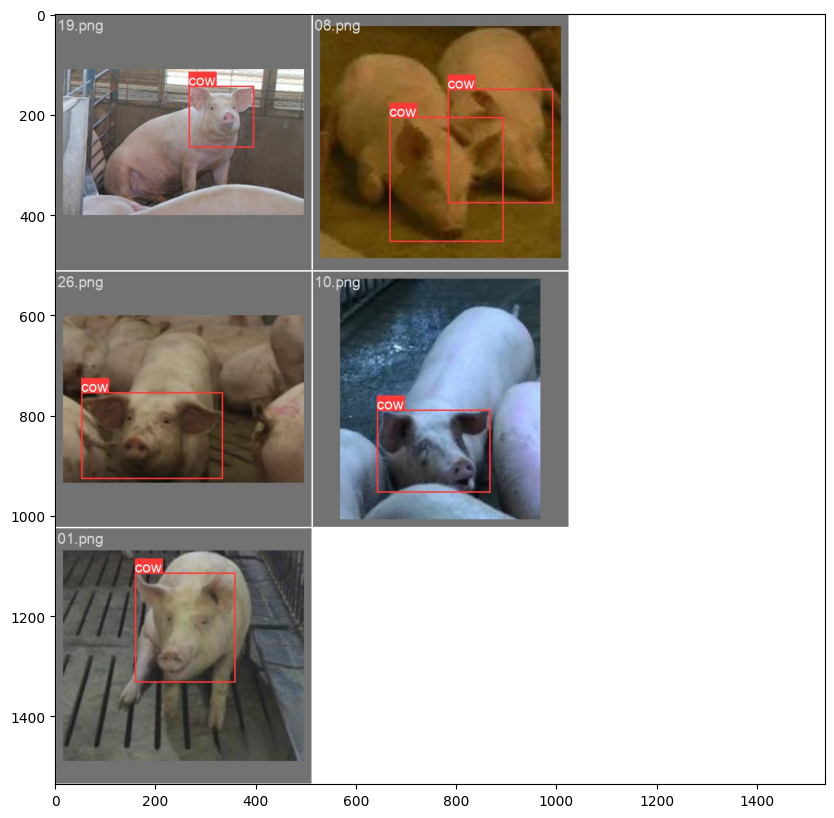

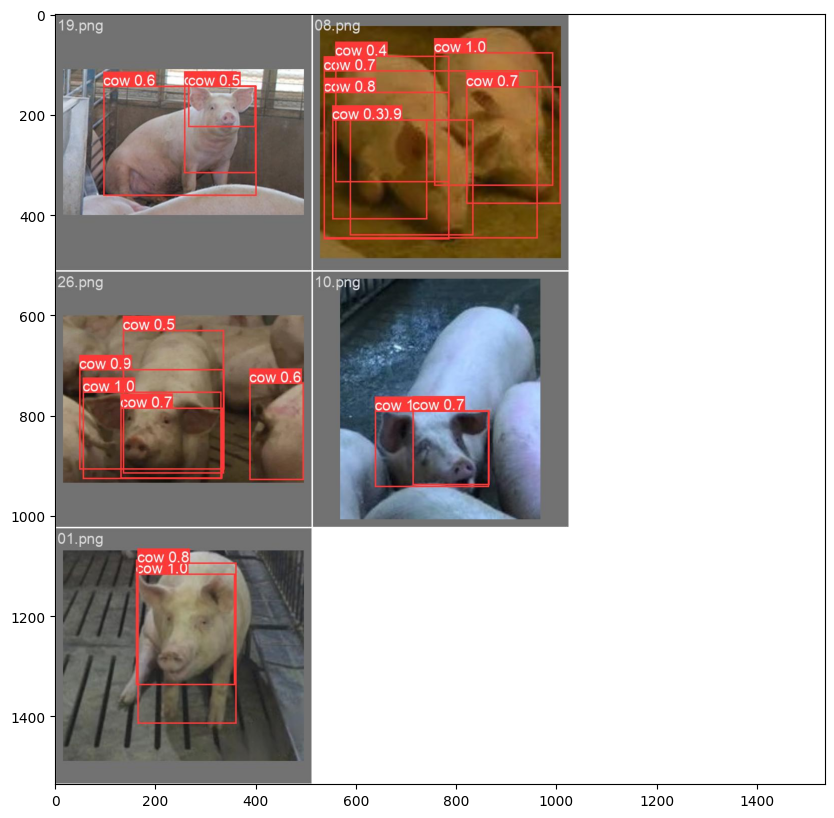

In [16]:
for path in paths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()

# Predict

In [17]:
best_path0='runs/detect/train/weights/best.pt'
source0='datasets/test'

In [18]:
!ls datasets/test

03.png	09.png	18.png	21.png	24.png	27.png
03.txt	09.txt	18.txt	21.txt	24.txt	27.txt


In [19]:
ppaths=[]
for dirname, _, filenames in os.walk(source0):
    for filename in filenames:
        if filename[-4:]=='.png' or filename[-4:]=='jpeg':
            ppaths+=[(os.path.join(dirname, filename))]
ppaths=sorted(ppaths)
print(len(ppaths))

6


In [20]:
model2 = YOLO(best_path0)

In [21]:
!yolo task=detect mode=predict model={best_path0} conf=0.6 source={source0}

Ultralytics YOLOv8.1.11 🚀 Python-3.10.13 torch-2.1.2+cpu CPU (Intel Xeon 2.20GHz)
Model summary (fused): 268 layers, 68124531 parameters, 0 gradients, 257.4 GFLOPs

image 1/6 /kaggle/working/datasets/test/03.png: 352x480 3 cows, 1192.3ms
image 2/6 /kaggle/working/datasets/test/09.png: 480x416 3 cows, 1706.9ms
image 3/6 /kaggle/working/datasets/test/18.png: 320x480 1 cow, 1296.3ms
image 4/6 /kaggle/working/datasets/test/21.png: 352x480 2 cows, 1045.0ms
image 5/6 /kaggle/working/datasets/test/24.png: 288x480 4 cows, 893.3ms
image 6/6 /kaggle/working/datasets/test/27.png: 352x480 4 cows, 1028.3ms
Speed: 1.5ms preprocess, 1193.7ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 480)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


# Result of Prediction

In [22]:
results = model2.predict(source0,conf=0.6)
print(len(results))
print(len(ppaths))


image 1/6 /kaggle/working/datasets/test/03.png: 352x480 3 cows, 1078.2ms
image 2/6 /kaggle/working/datasets/test/09.png: 480x416 3 cows, 1248.3ms
image 3/6 /kaggle/working/datasets/test/18.png: 320x480 1 cow, 930.5ms
image 4/6 /kaggle/working/datasets/test/21.png: 352x480 2 cows, 1018.6ms
image 5/6 /kaggle/working/datasets/test/24.png: 288x480 4 cows, 852.8ms
image 6/6 /kaggle/working/datasets/test/27.png: 352x480 4 cows, 1033.0ms
Speed: 1.7ms preprocess, 1026.9ms inference, 1.4ms postprocess per image at shape (1, 3, 352, 480)
6
6


In [23]:
PBOX=pd.DataFrame(columns=range(6))
for i in range(len(results)):
    arri=pd.DataFrame(results[i].boxes.data.cpu().numpy()).astype(float)
    path=ppaths[i]
    file=path.split('/')[-1]
    arri=arri.assign(file=file)
    arri=arri.assign(i=i)
    PBOX=pd.concat([PBOX,arri],axis=0)
PBOX.columns=['x','y','x2','y2','confidence','class','file','i']
display(PBOX)

/tmp/ipykernel_33/2361230193.py:8: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  PBOX=pd.concat([PBOX,arri],axis=0)


,x,y,x2,y2,confidence,class,file,i
0,372.679413,100.993462,581.691528,322.297302,0.823701,0.0,03.png,0.0
1,0.000000,0.000000,594.228394,385.057251,0.733777,0.0,03.png,0.0
2,261.730194,102.375755,535.575439,341.864716,0.618567,0.0,03.png,0.0
0,4.900077,32.626881,137.295868,147.340714,0.938620,0.0,09.png,1.0
1,2.670926,74.485268,136.544006,147.801773,0.759402,0.0,09.png,1.0
2,3.176017,37.541050,81.100441,92.539635,0.659445,0.0,09.png,1.0
0,312.793243,60.454971,542.857910,298.816986,0.999860,0.0,18.png,2.0
0,2.687356,9.043972,128.110199,137.939789,0.860151,0.0,21.png,3.0
1,75.306259,54.960007,257.312775,164.640305,0.639175,0.0,21.png,3.0
0,16.088167,113.761604,289.307587,202.428055,0.866818,0.0,24.png,4.0


In [24]:
PBOX['class']=PBOX['class'].apply(lambda x: class_map[int(x)])
PBOX=PBOX.reset_index(drop=True)
display(PBOX)
display(PBOX['class'].value_counts())

,x,y,x2,y2,confidence,class,file,i
0,372.679413,100.993462,581.691528,322.297302,0.823701,cow,03.png,0.0
1,0.000000,0.000000,594.228394,385.057251,0.733777,cow,03.png,0.0
2,261.730194,102.375755,535.575439,341.864716,0.618567,cow,03.png,0.0
3,4.900077,32.626881,137.295868,147.340714,0.938620,cow,09.png,1.0
4,2.670926,74.485268,136.544006,147.801773,0.759402,cow,09.png,1.0
5,3.176017,37.541050,81.100441,92.539635,0.659445,cow,09.png,1.0
6,312.793243,60.454971,542.857910,298.816986,0.999860,cow,18.png,2.0
7,2.687356,9.043972,128.110199,137.939789,0.860151,cow,21.png,3.0
8,75.306259,54.960007,257.312775,164.640305,0.639175,cow,21.png,3.0
9,16.088167,113.761604,289.307587,202.428055,0.866818,cow,24.png,4.0


class
cow    17
Name: count, dtype: int64

In [25]:
def draw_box2(n0):
    
    ipath=ppaths[n0]
    image=cv2.imread(ipath)
    H,W=image.shape[0],image.shape[1]
    file=ipath.split('/')[-1]
    
    if PBOX[PBOX['file']==file] is not None:
        box=PBOX[PBOX['file']==file]
        box=box.reset_index(drop=True)
        #display(box)

        for i in range(len(box)):
            label=box.loc[i,'class']
            x=int(box.loc[i,'x'])
            y=int(box.loc[i,'y'])
            x2=int(box.loc[i,'x2']) 
            y2=int(box.loc[i,'y2'])
            #print(label,x,y,x2,y2)
            #cv2.putText(image, f'{label}', (x, int(y-4)), 
            #            cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0,255,0),2)
            cv2.rectangle(image,(x,y),(x2,y2),(255,0,0),1)

    #plt.imshow(image)
    #plt.show()   
    
    return image

In [26]:
def create_animation(ims):
    fig=plt.figure(figsize=(12,8))
    im=plt.imshow(cv2.cvtColor(ims[0],cv2.COLOR_BGR2RGB))
    text = plt.text(0.05, 0.05, f'Slide {0}', transform=fig.transFigure, fontsize=14, color='blue')
    plt.axis('off')
    plt.close()

    def animate_func(i):
        im.set_array(cv2.cvtColor(ims[i],cv2.COLOR_BGR2RGB))
        text.set_text(f'Slide {i}')        
        return [im]    
    
    return animation.FuncAnimation(fig, animate_func, frames=len(ims), interval=1000//3)

In [27]:
images2=[]
for i in tqdm(range(len(ppaths))):
    images2+=[draw_box2(i)]

100%|██████████| 6/6 [00:00<00:00, 172.64it/s]


In [28]:
create_animation(images2)